# Paper figures

### Figure example 1: 

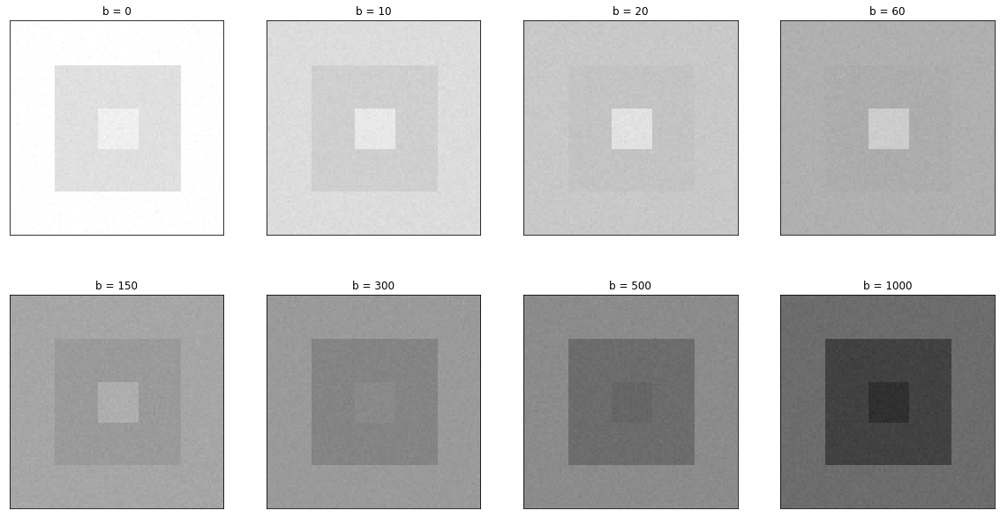

In [1]:
# import libraries
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as utils
from tqdm import tqdm

b_values = np.array([0,10,20,60,150,300,500,1000])
dwi_image = np.load('dwi_image.npy')

fig, ax = plt.subplots(2, 4, figsize=(20,20))
b_id = 0
for i in range(2):
    for j in range(4):
        ax[i, j].imshow(dwi_image[:, :, b_id], cmap='gray', clim=(0, 1600))
        ax[i, j].set_title('b = ' + str(b_values[b_id]))
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        b_id += 1
plt.subplots_adjust(hspace=-0.6)
plt.show()

### Figure example 2:

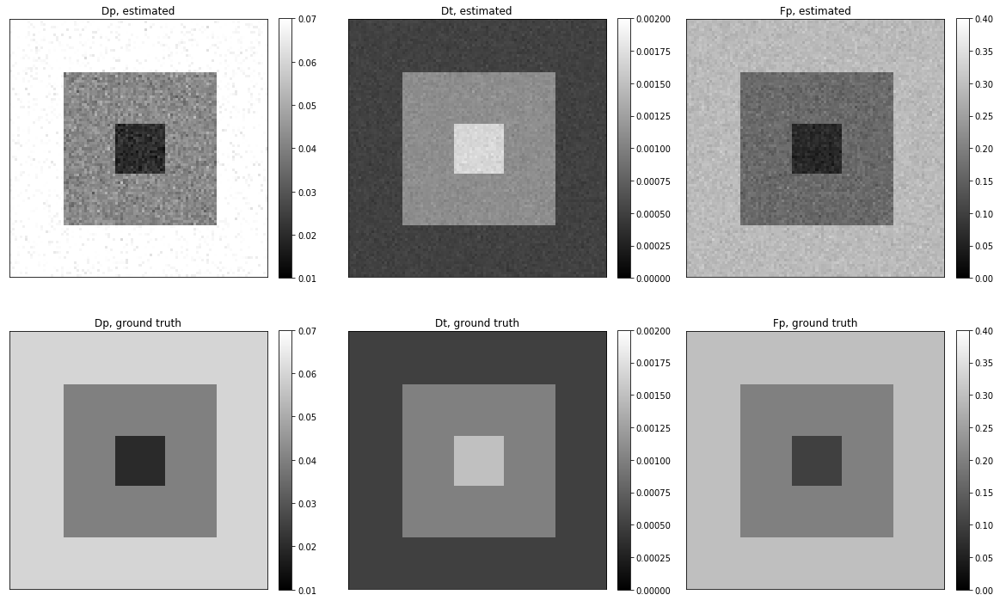

In [2]:
fig, ax = plt.subplots(2, 3, figsize=(20,20))
sx, sy, sb = 100, 100, len(b_values)

Dp = np.load('Dp.npy')
Dp_truth = np.load('Dp_truth.npy')
Dt = np.load('Dt.npy')
Dt_truth = np.load('Dt_truth.npy')
Fp = np.load('Fp.npy')
Fp_truth = np.load('Fp_truth.npy')

Dp_plot = ax[0,0].imshow(np.reshape(Dp, (sx, sy)), cmap='gray', clim=(0.01, 0.07))
ax[0,0].set_title('Dp, estimated')
ax[0,0].set_xticks([])
ax[0,0].set_yticks([])
fig.colorbar(Dp_plot, ax=ax[0,0], fraction=0.046, pad=0.04)

Dp_t_plot = ax[1,0].imshow(Dp_truth, cmap='gray', clim=(0.01, 0.07))
ax[1,0].set_title('Dp, ground truth')
ax[1,0].set_xticks([])
ax[1,0].set_yticks([])
fig.colorbar(Dp_t_plot, ax=ax[1,0], fraction=0.046, pad=0.04)

Dt_plot = ax[0,1].imshow(np.reshape(Dt, (sx, sy)), cmap='gray', clim=(0, 0.002))
ax[0,1].set_title('Dt, estimated')
ax[0,1].set_xticks([])
ax[0,1].set_yticks([])
fig.colorbar(Dt_plot, ax=ax[0,1],fraction=0.046, pad=0.04)

Dt_t_plot = ax[1,1].imshow(Dt_truth, cmap='gray', clim=(0, 0.002))
ax[1,1].set_title('Dt, ground truth')
ax[1,1].set_xticks([])
ax[1,1].set_yticks([])
fig.colorbar(Dt_t_plot, ax=ax[1,1], fraction=0.046, pad=0.04)

Fp_plot = ax[0,2].imshow(np.reshape(Fp, (sx, sy)), cmap='gray', clim=(0, 0.4))
ax[0,2].set_title('Fp, estimated')
ax[0,2].set_xticks([])
ax[0,2].set_yticks([])
fig.colorbar(Fp_plot, ax=ax[0,2],fraction=0.046, pad=0.04)

Fp_t_plot = ax[1,2].imshow(Fp_truth, cmap='gray', clim=(0, 0.4))
ax[1,2].set_title('Fp, ground truth')
ax[1,2].set_xticks([])
ax[1,2].set_yticks([])
fig.colorbar(Fp_t_plot, ax=ax[1,2], fraction=0.046, pad=0.04)

plt.subplots_adjust(hspace=-0.5)
plt.show()

# Plotly attempts 

### Figure 1: Plotly [Heatmap]

In [11]:
import plotly.graph_objects as go
import plotly.tools as tls
from IPython.core.display import display, HTML
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected = True)
config={'showLink': False, 'displayModeBar': False}

fig = go.Figure(go.Heatmap(z = Fp_truth,
                         colorscale='gray',
                          zmin = 0, 
                          zmax = 0.4))

fig.update_layout(title = "Fp. Ground Truth",
                  title_x = 0.5,
                  width = 500, 
                  height = 500,
                  xaxis = dict(showticklabels=False), 
                  yaxis = dict(showticklabels=False)
                 )


plot(fig, filename = 'fig.html', config = config)
display(HTML('fig.html'))
# iplot(fig, config=config)

## Figure 2: Plotly Updatemenus [Heatmap, Surface]

In [12]:
# create figure
fig2 = go.Figure()

# Add surface trace
fig2.add_trace(go.Heatmap(z = Fp_truth,
                         colorscale='gray',
                          zmin = 0, 
                          zmax = 0.4))



# Update plot sizing
fig2.update_layout(
    width=800,
    height=900,
    autosize=False,
    margin=dict(t=0, b=0, l=0, r=0),
    template="plotly_white",
)

# Update 3D scene options
fig2.update_scenes(
    aspectratio=dict(x=1, y=1, z=0.7),
    aspectmode="manual"
)

# Add dropdown
fig2.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["type", "heatmap"],
                    label="Heatmap",
                    method="restyle"
                ),
                dict(
                    args=["type", "surface"],
                    label="3D Surface",
                    method="restyle"
                )
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.115,
            xanchor="left",
            y=1.1,
            yanchor="top"
        ),
    ]
)

# Add annotation
fig2.update_layout(title = "Fp. Ground Truth",
                  title_x = 0.5,
    annotations=[
        dict(text="Type:", showarrow=False,
        x=0, y=1.085, yref="paper", align="left")
    ],
                   width=600,
                   height=600
)

plot(fig2, filename = 'fig2.html', config = config)
display(HTML('fig2.html'))
# iplot(fig2, config=config)

## Figure 3: Plotly Slider [Heatmaps] 

In [13]:
# Create figure
fig3 = go.Figure()

# Add traces, one for each slider step
b_id = 0
for i in range(2):
    for j in range(4):
        fig3.add_trace(go.Heatmap(z = dwi_image[:, :, b_id],
                          colorscale='gray',
                          zmin = 0, 
                          zmax = 1600, 
                          visible = False,
                          showlegend=False, 
                          name='b = ' + str(b_values[b_id])))
        b_id += 1

# Make 10th trace visible
fig3.data[0].visible = True

# Create and add slider
steps = []
for i in range(len(fig3.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig3.data)},
              {"title": "b = " + str(b_values[i])}],  # layout attribute
        label =  str(b_values[i])
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=0,
    currentvalue={"prefix": "Curent value: "},
    pad={"t": 50},
    steps=steps
)]

fig3.update_layout(
    sliders=sliders,
    title = "b=0",
    title_x = 0.5,
    width = 520, 
    height = 600,
    xaxis = dict(showticklabels=False), 
    yaxis = dict(showticklabels=False)
                 
)

plot(fig3, filename = 'fig3.html', config = config)
display(HTML('fig3.html'))
# iplot(fig3, config=config)